In [1]:
%matplotlib inline

# import packages
import numpy as np
import time
import pandas as pd

import matplotlib
import matplotlib.pyplot as plt
import matplotlib.colors as colors
import matplotlib.cm as cm
from matplotlib import gridspec


In [2]:
# define plot properties
from cycler import cycler
import matplotlib.cm as cm

from matplotlib import rcParams
from matplotlib import rc
from mpl_toolkits.axes_grid1 import make_axes_locatable

import matplotlib.animation as animation

def rgb(r,g,b):
    return (float(r)/256.,float(g)/256.,float(b)/256.)

cb2 = [rgb(31,120,180), rgb(255,127,0), rgb(51,160,44), rgb(227,26,28), \
       rgb(166,206,227), rgb(253,191,111), rgb(178,223,138), rgb(251,154,153)]

rcParams['figure.figsize'] = (9,7.5)
rcParams['figure.dpi'] = 300

rcParams['lines.linewidth'] = 1

rcParams['axes.prop_cycle'] = cycler('color', cb2)
rcParams['axes.facecolor'] = 'white'
rcParams['axes.grid'] = False

rcParams['patch.facecolor'] = cb2[0]
rcParams['patch.edgecolor'] = 'white'

#rcParams['font.family'] = 'Bitstream Vera Sans' 
rcParams['font.size'] = 23
#rcParams['font.weight'] = 300


> Make video.

0
0
10
20
30
40
50
60
70
80
90
100
0


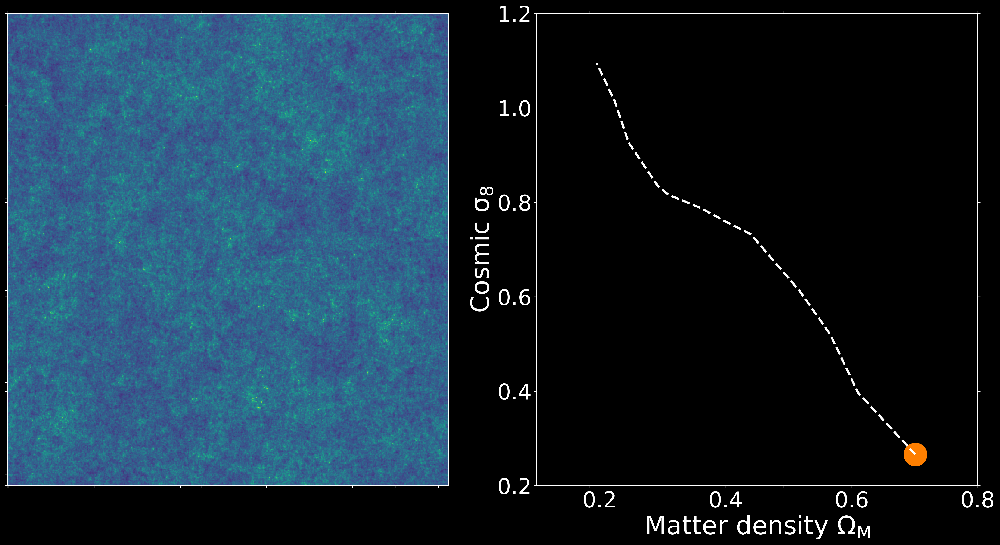

In [10]:
# invert color
rcParams['text.color'] = 'white'

rcParams['axes.facecolor'] = 'black'
rcParams['axes.edgecolor'] = 'white'
rcParams['axes.labelcolor'] = 'white'

rcParams['xtick.color'] = 'white'
rcParams['ytick.color'] = 'white'
rcParams['grid.color'] = 'white'

rcParams['figure.facecolor'] = 'black'
rcParams['figure.edgecolor'] = 'black'

rcParams['savefig.facecolor'] = 'black'
rcParams['savefig.edgecolor'] = 'black'

rcParams['font.size'] = 30


#=======================================================================================
# restore labels
y = np.load('sparse_grid_final_512pix_y_test.npy')
choose = [np.where((y[:,0] > 0.7) == 1)[0],
          np.where((np.abs(y[:,0]-0.6) < 0.05)*(np.abs(y[:,1]-0.4) < 0.05) == 1)[0],
          np.where((np.abs(y[:,0]-0.57) < 0.05)*(np.abs(y[:,1]-0.5) < 0.05))[0],
          np.where((np.abs(y[:,0]-0.5) < 0.05)*(np.abs(y[:,1]-0.6) < 0.05))[0],
          np.where((np.abs(y[:,0]-0.45) < 0.03)*(np.abs(y[:,1]-0.7) < 0.05))[0],
          np.where((np.abs(y[:,0]-0.4) < 0.03)*(np.abs(y[:,1]-0.75) < 0.05))[0],
          np.where((np.abs(y[:,0]-0.37) < 0.03)*(np.abs(y[:,1]-0.8) < 0.05))[0],
          np.where((np.abs(y[:,0]-0.3) < 0.01)*(np.abs(y[:,1]-0.8) < 0.02))[0],
          np.where((np.abs(y[:,0]-0.3) < 0.01)*(np.abs(y[:,1]-0.84) < 0.02))[0],
          np.where((np.abs(y[:,0]-0.25) < 0.02)*(np.abs(y[:,1]-0.9) < 0.03))[0],
          np.where((np.abs(y[:,0]-0.22) < 0.02)*(np.abs(y[:,1]-1.0) < 0.03))[0],
          np.where((y[:,0] < 0.21)*(y[:,1] > 1.05))[0]]
cosmo_parameter = [y[choose[i][0],:] for i in range(12)]
cosmo_parameter = np.array(cosmo_parameter)

#-------------------------------------------------------------------------------------
# load data and interpolate
snapshots = []
cosmoshots = []

for i in range(11):
    image1 = np.load("../generate_image_results_J=5_L=1_order=1_flux_matching/"
                      + "max_order=1_ind=" + str(i) + ".npy").reshape(1024,1024) - 5.
    image2 = np.load("../generate_image_results_J=5_L=1_order=1_flux_matching/"
                      + "max_order=1_ind=" + str(i+1) + ".npy").reshape(1024,1024) - 5.
    cosmo1 = cosmo_parameter[i,:]
    cosmo2 = cosmo_parameter[i+1,:]
    
    for j in range(10):
        snapshots.append(image1 + (image2-image1)*j/10.)
        cosmoshots.append(cosmo1 + (cosmo2-cosmo1)*j/10.)
        
for j in range(10):
    snapshots.append(image2)
    cosmoshots.append(cosmo2)



#=======================================================================================
# initiate the plot
fig = plt.figure(figsize=[24,12]);
matplotlib.rcParams['axes.linewidth'] = 1.

# combine subplots
ax = fig.add_subplot(111)

ax.spines['top'].set_color('none')
ax.spines['bottom'].set_color('none')
ax.spines['left'].set_color('none')
ax.spines['right'].set_color('none')
ax.tick_params(labelcolor='w', top='off', bottom='off', left='off', right='off')

plt.setp(ax.get_xticklabels(), visible=False)
plt.setp(ax.get_yticklabels(), visible=False)


#===========================================================================================================
# initiate subplot
ax = fig.add_subplot(121)

plt.setp(ax.get_xticklabels(), visible=False)
plt.setp(ax.get_yticklabels(), visible=False)

# initiate
a = snapshots[0]
im = plt.imshow(a, interpolation='none', aspect='auto', vmin=-0.05, vmax=0.1)

#---------------------------------------------------------------------------------------
# initiate subplot
ax2 = fig.add_subplot(122)
plt.xlim([0.1,0.8])
plt.ylim([0.2,1.2])

plt.xlabel(r"Matter density " + r"$\mathregular{\Omega_M}$", fontsize=35)
plt.ylabel(r"Cosmic " + r"$\mathregular{\sigma_8}$", fontsize=35)

cosmoshots = np.array(cosmoshots)
plt.plot(cosmoshots[:,0], cosmoshots[:,1], color="white", lw=3, ls="--")


#===========================================================================================
# animate
def animate_func(i):
    if i%10 == 0:
        print(i)
        
    im.set_array(snapshots[i])

    ax2.collections.clear()
    ax2.scatter(cosmoshots[i,0], cosmoshots[i,1], s=1000, color=cb2[1])
        
    return [im]

fps = 10
anim = animation.FuncAnimation(fig, animate_func, frames = 110-1,
                               interval = 1000/fps, # in ms
                              )

#---------------------------------------------------------------------------------------
# save video
anim.save('../Weak_Lensing_Emulation_2.mp4', fps=fps, extra_args=['-vcodec', 'libx264'])


0
0
10
20
30
40
50
60
70
80
90
100
0


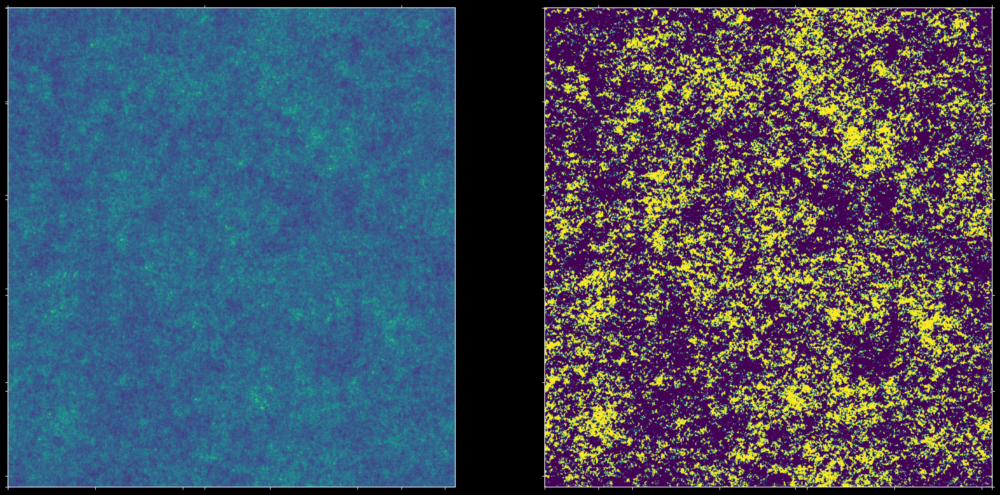

In [11]:
# invert color
rcParams['text.color'] = 'white'

rcParams['axes.facecolor'] = 'black'
rcParams['axes.edgecolor'] = 'white'
rcParams['axes.labelcolor'] = 'white'

rcParams['xtick.color'] = 'white'
rcParams['ytick.color'] = 'white'
rcParams['grid.color'] = 'white'

rcParams['figure.facecolor'] = 'black'
rcParams['figure.edgecolor'] = 'black'

rcParams['savefig.facecolor'] = 'black'
rcParams['savefig.edgecolor'] = 'black'

rcParams['font.size'] = 30


#=======================================================================================
# load data and interpolate
snapshots = []
snapshots2 = []
for i in range(10):
    image1 = np.load("../generate_image_results_J=5_L=1_order=1_flux_matching/"
                      + "max_order=1_ind=" + str(i) + ".npy").reshape(1024,1024) - 5.
    image2 = np.load("../generate_image_results_J=5_L=1_order=1_flux_matching/"
                      + "max_order=1_ind=" + str(i+1) + ".npy").reshape(1024,1024) - 5.
    
    diff1 = np.load("../generate_image_results_J=5_L=1_order=1_flux_matching/"\
                      + "max_order=1_ind=" + str(i+1) + ".npy").reshape(1024,1024)\
            - np.load("../generate_image_results_J=5_L=1_order=1_flux_matching/"\
                      + "max_order=1_ind=" + str(i) + ".npy").reshape(1024,1024)
    diff2 = np.load("../generate_image_results_J=5_L=1_order=1_flux_matching/"\
                      + "max_order=1_ind=" + str(i+2) + ".npy").reshape(1024,1024)\
            - np.load("../generate_image_results_J=5_L=1_order=1_flux_matching/"\
                      + "max_order=1_ind=" + str(i+1) + ".npy").reshape(1024,1024)
        
    for j in range(10):
        snapshots.append(image1 + (image2-image1)*j/10.)
        snapshots2.append(diff1 + (diff2-diff1)*j/10.)

for j in range(10):
    snapshots.append(image2)
    snapshots2.append(diff2)
    
    
#=======================================================================================
# initiate the plot
fig = plt.figure(figsize=[24,12]);
matplotlib.rcParams['axes.linewidth'] = 1.

# combine subplots
ax = fig.add_subplot(111)

ax.spines['top'].set_color('none')
ax.spines['bottom'].set_color('none')
ax.spines['left'].set_color('none')
ax.spines['right'].set_color('none')
ax.tick_params(labelcolor='w', top='off', bottom='off', left='off', right='off')

plt.setp(ax.get_xticklabels(), visible=False)
plt.setp(ax.get_yticklabels(), visible=False)


#===========================================================================================================
# initiate subplot
ax = fig.add_subplot(121)

plt.setp(ax.get_xticklabels(), visible=False)
plt.setp(ax.get_yticklabels(), visible=False)

# initiate
a = snapshots[0]
im = plt.imshow(a, interpolation='none', aspect='auto', vmin=-0.05, vmax=0.1)

#---------------------------------------------------------------------------------------
# initiate subplot
ax = fig.add_subplot(122)

plt.setp(ax.get_xticklabels(), visible=False)
plt.setp(ax.get_yticklabels(), visible=False)

# initiate
a2 = snapshots[0]
im2 = plt.imshow(a2, interpolation='none', aspect='auto', vmin=-0.001, vmax=0.003)


#===========================================================================================
# animate
def animate_func(i):
    if i%10 == 0:
        print(i)
        
    im.set_array(snapshots[i])
    im2.set_array(snapshots2[i])
    return [im, im2]

fps = 10
anim = animation.FuncAnimation(fig, animate_func, frames = 110,
                               interval = 1000/fps, # in ms
                              )

#---------------------------------------------------------------------------------------
# save video
anim.save('../Weak_Lensing_Emulation_1.mp4', fps=fps, extra_args=['-vcodec', 'libx264'])


> Image reconstruction results.

In [ ]:
# initiate the plot
fig = plt.figure(figsize=[12,12]);
matplotlib.rcParams['axes.linewidth'] = 1.

# combine subplots
ax = fig.add_subplot(111)

ax.spines['top'].set_color('none')
ax.spines['bottom'].set_color('none')
ax.spines['left'].set_color('none')
ax.spines['right'].set_color('none')
ax.tick_params(labelcolor='w', top='off', bottom='off', left='off', right='off')

plt.setp(ax.get_xticklabels(), visible=False)
plt.setp(ax.get_yticklabels(), visible=False)

image2 = np.load("../max_order=2_ind=0.npy").reshape(1024,1024) - 5.
#image3 = np.load("../max_order=1_generate_image/max_order=1_ind=9.npy").reshape(1024,1024) - 5.
plt.imshow(image2, vmin=-0.05, vmax=0.1)
#plt.imshow(image2-image3, vmin=-0.001, vmax=0.003)

plt.tight_layout()
plt.savefig("../Image_5.png")

In [ ]:
image = np.load("../max_order=2_ind=0.npy").reshape(1024,1024) - 5.
plt.hist(image.ravel(), alpha=0.5, range=[-0.1,0.1], bins=100, normed=True);

#image = np.load("../max_order=1_ind=1.npy").reshape(1024,1024) - 5.
#plt.hist(image.ravel(), alpha=0.5, range=[-0.1,0.1], bins=100, normed=True);

image = np.load("cdf_array.npy")[6,:] - 5.
plt.hist(image.ravel(), alpha=0.5, range=[-0.1,0.1], bins=100, normed=True);

plt.ylabel("Number of pixels")
plt.xlabel("Flux value")

In [ ]:
# Check coefficient reconstruction
ind = 0
scatter_coeff = np.load("../max_order=2_scatter_coeff_ind=" + str(ind) + ".npy")
target_coeff = np.load("scatter_coeff_max_order=2.npy")[ind,:]

# calculate fractional error
frac_diff = np.abs(target_coeff[1:]-scatter_coeff[1:])/np.abs(target_coeff[1:])

plt.hist(np.log10(frac_diff), range=[-7,-1], bins=61)

> Inspect weak lensing simulation parameters.

In [ ]:
y = np.load('sparse_grid_final_512pix_y_test.npy')
print(y.shape)
print(y[0,:])
plt.scatter(y[:,0],y[:,1])

choose = [np.where((y[:,0] > 0.7) == 1)[0],
          np.where((np.abs(y[:,0]-0.6) < 0.05)*(np.abs(y[:,1]-0.4) < 0.05) == 1)[0],
          np.where((np.abs(y[:,0]-0.57) < 0.05)*(np.abs(y[:,1]-0.5) < 0.05))[0],
          np.where((np.abs(y[:,0]-0.5) < 0.05)*(np.abs(y[:,1]-0.6) < 0.05))[0],
          np.where((np.abs(y[:,0]-0.45) < 0.03)*(np.abs(y[:,1]-0.7) < 0.05))[0],
          np.where((np.abs(y[:,0]-0.4) < 0.03)*(np.abs(y[:,1]-0.75) < 0.05))[0],
          np.where((np.abs(y[:,0]-0.37) < 0.03)*(np.abs(y[:,1]-0.8) < 0.05))[0],
          np.where((np.abs(y[:,0]-0.3) < 0.01)*(np.abs(y[:,1]-0.8) < 0.02))[0],
          np.where((np.abs(y[:,0]-0.3) < 0.01)*(np.abs(y[:,1]-0.84) < 0.02))[0],
          np.where((np.abs(y[:,0]-0.25) < 0.02)*(np.abs(y[:,1]-0.9) < 0.03))[0],
          np.where((np.abs(y[:,0]-0.22) < 0.02)*(np.abs(y[:,1]-1.0) < 0.03))[0],
          np.where((y[:,0] < 0.21)*(y[:,1] > 1.05))[0]]

for i in range(len(choose)):
    print(choose[i].shape)
    print(choose[i])

In [ ]:
# avoid MPI problem
import os
os.environ["KMP_DUPLICATE_LIB_OK"]="TRUE"

# import packages
from kymatio import Scattering2D

# make scattering coefficients
J_choice = 5
L_choice = 4
max_order_choice = 2
scattering = Scattering2D(J=J_choice, shape=(512,512),\
                          L=L_choice, max_order=max_order_choice)

import torch
scatter_coeff = []
for i in range(len(choose)):
    print(i)
    x_image = np.load('../weak_lensing_data/sparse_grid_final_512pix_x_test.npy')[choose[i],:,:,0]
    x_image = torch.from_numpy(x_image).type(torch.FloatTensor) + 5.
    scatter_coeff.append(np.median(scattering(x_image).mean(dim=(2,3)).log(), axis=0))
scatter_coeff = np.array(scatter_coeff)

# evaluate the coefficient
#x_image = np.load('../weak_lensing_data/sparse_grid_final_512pix_x_test.npy')[choose,:,:,0]
#x_image = torch.from_numpy(x_image).type(torch.FloatTensor) + 5.
#scatter_coeff2 = scattering(x_image).mean(dim=(2,3)).log()

# save results
np.save("scatter_coeff_max_order=2.npy", scatter_coeff)


In [ ]:
for i in range(20):
    plt.scatter(np.zeros(153)+i, scatter_coeff[:,1+i], color=cb2[0])
    plt.scatter(np.zeros(153)+i, scatter_coeff2[:,1+i], color=cb2[1])
    

> Inspect the weak lensing data.

In [ ]:
# import packages
import numpy as np

# load data
x = np.load('../weak_lensing_data/sparse_grid_final_512pix_x_test.npy')[choose[6][0:10],:,:,0]

In [ ]:
#plt.hist(np.log(x.ravel()+0.03),bins=100, range=[0.,0.1]);

# save an unsmoothed image as original guess
np.save("image_initial", x[:10,:,:])


> Calculate median CDF.

In [ ]:
# import packages
import numpy as np

# load data
cdf_array = []
for i in range(len(choose)):
    print(i)
    x = np.load('../weak_lensing_data/sparse_grid_final_512pix_x_test.npy')[choose[i],:,:,0]
    cdf_array.append(np.sort(x.flatten())[::x.shape[0]] + 5)
    
# convert to numpy and save
cdf_array = np.array(cdf_array)
print(cdf_array.shape)
np.save("cdf_array.npy", cdf_array)


In [ ]:
for i in range(4):
    plt.hist(cdf_array[i,:]-5., alpha=0.5, bins=100, range=[-0.05,0.05], color=cb2[i])
    

> Illustrate weak lensing data.

In [ ]:
# choose images
#ind = (y[:,0] < 0.2)*(y[:,1] > 1.)
ind = (np.abs(y[:,0]-0.3) < 0.02)

print(np.where(ind == 1))
print(y[ind,:])

#---------------------------------------------------------------------------------------------------------
# save figure
# invert color
rcParams['text.color'] = 'white'

rcParams['axes.facecolor'] = 'black'
rcParams['axes.edgecolor'] = 'white'
rcParams['axes.labelcolor'] = 'white'

rcParams['xtick.color'] = 'white'
rcParams['ytick.color'] = 'white'
rcParams['grid.color'] = 'white'

rcParams['figure.facecolor'] = 'black'
rcParams['figure.edgecolor'] = 'black'

rcParams['savefig.facecolor'] = 'black'
rcParams['savefig.edgecolor'] = 'black'

#---------------------------------------------------------------------------------------------------------
fig = plt.figure(figsize=(8,8))
ax = fig.gca()
plt.setp(ax.get_xticklabels(), visible=False);
plt.setp(ax.get_yticklabels(), visible=False);
#plt.imshow(np.tanh(x[918,:,:]*15));
plt.imshow(np.tanh(x[3977,:,:]*15));
plt.tight_layout()
plt.savefig("../Weak_Lensing_2.png")


In [ ]:
# augment data
training_x = np.repeat(training_x,4,axis=0)
for i in range(training_x.shape[0]):
    if i%4 == 1:
            training_x[i,:,:] = np.flipud(training_x[i,:,:])

        if i%4 == 2:
            training_x[i,:,:] = np.fliplr(training_x[i,:,:])

        if i%4 == 3:
            training_x[i,:,:] = np.fliplr(np.flipud(training_x[i,:,:]))

        if i%1e3 == 0:
            print(i)

> Loading into data loader.

In [ ]:
# import packages
import torch
import torch.utils.data as utils

# transform to torch tensors
tensor_x = torch.Tensor(x)


> Define wavelet scattering.

In [ ]:
# import wavelet scattering
from kymatio import Scattering2D
import kymatio
import time

# define scattering as an object
scattering = Scattering2D(J=4, shape=(tensor_x[0].shape), L=3, max_order=3)

start_time = time.time()
Sx = scattering(tensor_x).mean(dim=(2,3))
print(Sx.shape)
print(time.time()-start_time)


In [ ]:
plt.hist(np.log10(Sx[0,1:]),bins=50);

> Illustrate the wavelet scattering coefficients.

In [ ]:
import torch
# restore real coefficients from training
target_coeff_array = np.load("Sx_training_expected_110.npy")

# taking to log to avoid normalization problem
target_coeff_array = np.log10(target_coeff_array)

# choose on of the entry
target_coeff = target_coeff_array[0,0:] # eliminate the zero-th layer
target_coeff = torch.from_numpy(target_coeff).type(torch.FloatTensor) + 4

print(target_coeff)


> Combine different coefficients.

In [ ]:
# choose train or testing set
train_name = "train"

# loop over all scales
for l in range(1):
    for j in range(7):
        Sx_training_temp = np.load("../Sx_" + train_name + "ing_L=" + str(l+7) 
                                   + "_J=" + str(j+1) + "_expected_110.npy")[:,1:]
        
        if l == 0 and j == 0:
            Sx_training = np.copy(Sx_training_temp)
        else:
            Sx_training = np.hstack([Sx_training, Sx_training_temp])
            
        print(Sx_training.shape)
np.save("../Sx_" + train_name + "ing_expected_110.npy", Sx_training)


> Train NN.

In [ ]:
# import packages
import torch
from torch.nn import Linear, LeakyReLU, MSELoss, Sequential
from torch.optim import Adam
    
    
#=========================================================================================================
# import training set
Sx_tr = np.log10(np.load("Sx_training_expected.npy"))
Sx_tr = torch.from_numpy(Sx_tr).type(torch.FloatTensor)[:,1:]
y_tr = np.load('sparse_grid_final_512pix_y_train.npy')
y_tr = torch.from_numpy(y_tr).type(torch.FloatTensor)[:,:]

# randomize
ind_shuffle = np.arange(y_tr.shape[0])
np.random.shuffle(ind_shuffle)
Sx_tr = Sx_tr[ind_shuffle,:][:,:]
y_tr = y_tr[ind_shuffle,:][:,:]

# standardize
mu_tr = Sx_tr.mean(dim=0)
std_tr = Sx_tr.std(dim=0)
Sx_tr = (Sx_tr - mu_tr) / std_tr

mu_y = y_tr.mean(dim=0)
std_y = y_tr.std(dim=0)
y_tr = (y_tr - mu_y) / std_y


#=========================================================================================================
# input/out dimensions
num_input = Sx_tr.shape[-1]
num_output = y_tr.shape[-1]
num_neuron = 200

# define networks
model = Sequential(\
            Linear(num_input, num_neuron), LeakyReLU(),\
            Linear(num_neuron, num_neuron), LeakyReLU(),\
            Linear(num_neuron, num_output))
optimizer = Adam(model.parameters())
criterion = MSELoss()

#----------------------------------------------------------------------------------------------
# If cuda is available use it.
use_cuda = torch.cuda.is_available()

if use_cuda:
    model = model.cuda()
    criterion = criterion.cuda()
    
#----------------------------------------------------------------------------------------------
# Number of signals to use in each gradient descent step (batch).
batch_size = 32

# Number of epochs.
num_epochs = 1000

# Learning rate for Adam.
lr = 1e-4

#----------------------------------------------------------------------------------------------
# break into batches
nsamples = Sx_tr.shape[0]
nbatches = nsamples // batch_size

#----------------------------------------------------------------------------------------------
# train the network
for e in range(num_epochs):
    
    # Randomly permute the data. If necessary, transfer the permutation to the
    # GPU.
    perm = torch.randperm(nsamples)
    if use_cuda:
        perm = perm.cuda()

    # For each batch, calculate the gradient with respect to the loss and take
    # one step.
    for i in range(nbatches):
        idx = perm[i * batch_size : (i+1) * batch_size]
        model.zero_grad()
        resp = model.forward(Sx_tr[idx])
        loss = criterion(resp, y_tr[idx])
        loss.backward()
        optimizer.step()

    # Calculate the response of the training data at the end of this epoch and
    # the average loss.
    resp = model.forward(Sx_tr)
    avg_loss = criterion(resp, y_tr)

    if e % 50 == 0:
        print('Epoch {}, average loss = {:1.3f}'.format(e, avg_loss*1e4))


> Perform cross-validation.

In [ ]:
# import training set
Sx_te = np.log10(np.load("Sx_testing_expected.npy"))
Sx_te = torch.from_numpy(Sx_te).type(torch.FloatTensor)[:,1:]
y_te = np.load('sparse_grid_final_512pix_y_test.npy')
y_te = torch.from_numpy(y_te).type(torch.FloatTensor)

# standardize
Sx_te = (Sx_te - mu_tr) / std_tr
y_te = (y_te - mu_y) / std_y


#=========================================================================================================
# make predictions
resp = model.forward(Sx_te)
avg_loss = criterion(resp, y_te)

print('TEST, average loss = {:1.3f}'.format(avg_loss*1e4))

#-----------------------------------------------------------------------------------------
# restore back to the original unit
resp = resp*std_y + mu_y
y_te = y_te*std_y + mu_y

#-----------------------------------------------------------------------------------------
# save results
np.savez("results.npz", resp=resp.detach().numpy(),\
                        y_te=y_te.detach().numpy())


In [ ]:
# restore results
temp = np.load("../results110_training_size=28000.npz")
resp_numpy = temp["resp_best"]
y_te_numpy = temp["y_te"]

plt.figure(figsize=(15, 7.5), dpi=300)
plt.subplot(121)
plt.scatter(y_te_numpy[:,0],resp_numpy[:,0], s=5)
plt.xlabel(r"$\mathregular{\Omega_m}$" + " simulation")
plt.ylabel(r"$\mathregular{\Omega_m}$" + " predict")
plt.plot([0.15,0.75],[0.15,0.75], color="black")
print(np.std(y_te_numpy[:,0]-resp_numpy[:,0]), np.std(y_te_numpy[:,0]))

plt.subplot(122)
plt.xlabel(r"$\mathregular{\sigma_8}$" + " simulation")
plt.ylabel(r"$\mathregular{\sigma_8}$" + " predict")
plt.scatter(y_te_numpy[:,1],resp_numpy[:,1], s=5)
plt.plot([0.1,1.25],[0.1,1.25], color="black")
print(np.std(y_te_numpy[:,1]-resp_numpy[:,1]), np.std(y_te_numpy[:,1]))


> Plot error as a function of noise.

In [ ]:
# noise level array
noise_level = (np.arange(10)+1)*10
sigma_error = np.zeros(noise_level.size)


#===============================================================================
# loop over all noise level
for i in range(noise_level.size):
    
    # restore results
    temp = np.load("../J=5_L=2_order=3/results" + str(noise_level[i]) + "_training_size=30.npz")
    resp_numpy = temp["resp_best"]
    y_te_numpy = temp["y_te"]
    
    # calculate error
    sigma_error[i] = np.std(resp_numpy.ravel()-y_te_numpy.ravel())
    
#-----------------------------------------------------------------------------
# plot error
plt.figure(figsize=(10, 10.))
plt.plot(noise_level,sigma_error, ls=":", label="Training size = 30", color="black", lw=5)



#===============================================================================
# loop over all noise level
for i in range(noise_level.size):
    
    # restore results
    temp = np.load("../J=5_L=2_order=3/results" + str(noise_level[i]) + "_training_size=100.npz")
    resp_numpy = temp["resp_best"]
    y_te_numpy = temp["y_te"]
    
    # calculate error
    sigma_error[i] = np.std(resp_numpy.ravel()-y_te_numpy.ravel())
    
#-----------------------------------------------------------------------------
# plot error
plt.plot(noise_level,sigma_error, color="black", ls="--", label="Training size = 100", lw=3)


#===============================================================================
# loop over all noise level
for i in range(noise_level.size):
    
    # restore results
    temp = np.load("../J=5_L=2_order=3/results" + str(noise_level[i]) + "_training_size=1000.npz")
    resp_numpy = temp["resp_best"]
    y_te_numpy = temp["y_te"]
    
    # calculate error
    sigma_error[i] = np.std(resp_numpy.ravel()-y_te_numpy.ravel())
    
#-----------------------------------------------------------------------------
# plot error
plt.plot(noise_level,sigma_error, color="black", ls="-.", label="Training size = 1000", lw=3)


#===============================================================================
# loop over all noise level
for i in range(noise_level.size):
    
    # restore results
    temp = np.load("../J=5_L=2_order=3/results" + str(noise_level[i]) + "_training_size=28000.npz")
    resp_numpy = temp["resp_best"]
    y_te_numpy = temp["y_te"]
    
    # calculate error
    sigma_error[i] = np.std(resp_numpy.ravel()-y_te_numpy.ravel())
    
#-----------------------------------------------------------------------------
# plot error
plt.plot(noise_level,sigma_error, color="black", label="Training size = 28000", lw=3)


#===============================================================================
# plot base line method
plt.plot([10,30,50,75,100],\
         [0.098526, 0.080098, 0.072786, 0.065057, 0.059709],\
         color=cb2[3], label="Gupta+ 2018 (CNN)", lw=5)
plt.plot([10,30,50,75,100],\
         [0.076240, 0.054290, 0.045940, 0.039580, 0.035780],\
         color=cb2[0], label="Ribli+ 2019 (CNN)", lw=5)


#===============================================================================
# save figure
plt.xlabel("Noise level " + r"$\mathregular{(n_{gal}/arcmin^{-2})}$" )
plt.ylabel(r"$\mathregular{\Omega_m\;/\;\sigma_8}$" + " mean absolute error")
plt.ylim([0.03,0.16])
plt.legend(frameon=False)
plt.tight_layout()
plt.savefig("Wavelet_Recovery.png")

> Make banana plot.

In [ ]:
# from Deszo Ribli
import pickle
import scipy
from IPython.core.pylabtools import figsize
import seaborn as sns
from matplotlib.colors import ListedColormap

from wl_descriptor import WLDescriptor


#==========================================================================================
# make contour plot
def plot_contours(x, y, param_set, chis_pc=None, chis_reg=None, chis_cls=None, 
                  xlimits = (0.18,0.7), ylimits=(0.2,1.15), N=300, 
                  label1 = 'power spectrum', label2 = 'peak steepness', label3 = 'deep learning\nrepresentation',
                  alpha=1.0, show_lines=True, levels = [0.05,0.32,1], level_idx =0,
                  colors = ['Reds', 'Greens', 'Blues']):
    """Plot contours."""
    figsize(8,8)
    
    # plot the training set
    #for param in param_set:
    #    plt.plot([param[0]],[param[1]],'x', ms=5, c='k')
        
#-------------------------------------------------------------------------------------------
    text = r', $A_{%d'%(100*(1-levels[level_idx])) + r'}^{-1}=$'
    if chis_pc is not None:
        chis = np.array(chis_pc,copy=True)
        chis /= chis[~np.isnan(chis)].sum()
        cs = np.sort(chis[~np.isnan(chis)].flatten())
        chi_levels = [cs[np.arange(0,len(cs))[(np.cumsum(cs)>=l)][0]] for l in levels]
        cmap = ListedColormap(sns.color_palette(colors[0], len(levels)-1))
        plt.contourf(x,y,chis, cmap=cmap, levels = chi_levels, alpha=alpha)
        a95 = ((0.7-0.18)*(1.2-0.2)*(chis[~np.isnan(chis)]>chi_levels[level_idx]).sum())/N**2
        # print the area under 1 sigma
        #plt.plot([],[],lw=5,c=cmap(1),label=label1 + text+r' %d' % (1./a95)) 
        plt.plot([],[],lw=5,c=cmap(1),label=label1)
        if show_lines:
            plt.contour(x,y,chis,cmap=cmap, levels = chi_levels, linewidths=3)
            
#-------------------------------------------------------------------------------------------
    if chis_cls is not None:
        chis = np.array(chis_cls,copy=True)
        chis /= chis[~np.isnan(chis)].sum()
        cs = np.sort(chis[~np.isnan(chis)].flatten())
        chi_levels = [cs[np.arange(0,len(cs))[(np.cumsum(cs)>=l)][0]] for l in levels]
        cmap = ListedColormap(sns.color_palette(colors[2], len(levels)-1))
        plt.contourf(x,y,chis, cmap=cmap, levels = chi_levels, alpha=alpha)
        a95 = ((0.7-0.18)*(1.2-0.2)*(chis[~np.isnan(chis)]>chi_levels[level_idx]).sum())/N**2
        # print the area under 1 sigma
        #plt.plot([],[],lw=5,c=cmap(1),label=label3 + text+r' %d' % (1./a95))
        plt.plot([],[],lw=5,c=cmap(1),label=label3)
        if show_lines:
            plt.contour(x,y,chis,cmap=cmap, levels = chi_levels, linewidths=3)
        
#-------------------------------------------------------------------------------------------
    plt.xlim(*xlimits)
    plt.ylim(*ylimits)
    plt.legend(loc="upper right", frameon=False)
    plt.xlabel(r'$\Omega_m$')
    plt.ylabel(r'$\sigma_8$')

    
#==========================================================================================
# calculate likeliohod
def likelihood(descriptor, param_set, fiducial_values=(0.309,0.816), N=300, 
               interpolate_cov=True, scale=1.):
    
    """ Caluclate likelihood of fiducial mock observations."""
    param_set = [(p[0],p[1]) for p in param_set]
    
    # get means
    means = []
    for param in sorted(param_set):
        means.append(descriptor.mean_descriptor[param])

    # get fiducial cov and mean
    fid_mean = descriptor.mean_descriptor[fiducial_values]
    fid_inv_cov = descriptor.inv_cov[fiducial_values]

#-------------------------------------------------------------------------------------------
    # interpolate means
    oms = [param[0] for param in sorted(param_set)]
    sis = [param[1] for param in sorted(param_set)]
    x, y = np.linspace(0.18,0.7,N),np.linspace(0.2,1.2,N)
    x, y = np.meshgrid(x,y)

    # interpolate inverse covariances
    int_means = scipy.interpolate.griddata(np.column_stack((oms, sis)),
                                           means,(x,y), method="linear")
    if interpolate_cov:
        covs = [descriptor.inv_cov[param] for param in sorted(param_set)]
        int_inv_covs = scipy.interpolate.griddata(np.column_stack((oms, sis)),
                                             covs,(x,y), method="linear")
        
#-------------------------------------------------------------------------------------------
    # caluclate likelihoods 
    likelihoods = np.zeros((N,N))
    for i in range(N):
        for j in range(N):
            d = np.matrix((fid_mean - int_means[i,j]))
            if interpolate_cov:
                likelihoods[i,j] = np.exp(-0.5 * scale * d * int_inv_covs[i,j] * d.T)
            else:
                likelihoods[i,j] = np.exp(-0.5 * scale * d * fid_inv_cov * d.T)
                
    return x,y,likelihoods


#==========================================================================================
# calculate likelihood
def likelihood_nn(y, p, param_set, fiducial_values=(0.309,0.816), N=300, 
                  N_SAMPLE=153, interpolate_cov=True, scale=1.):
    
    """ Caluclate likelihood of fiducial mock observations for a CNN."""
    
    # get means
    means, inv_covs = [],[]
    for param in sorted(param_set):
        idx = (y[:,0]==param[0]) & (y[:,1]==param[1])
        means.append(p[idx].mean(axis=0))
        inv_covs.append(np.linalg.pinv(np.cov(p[idx].T)))

    # get fiducial mean and cov
    idx = (y[:,0]==fiducial_values[0]) & (y[:,1]==fiducial_values[1])
    fid_mean = p[idx].mean(axis=0)
    fid_inv_cov = np.linalg.pinv(np.cov(p[idx].T))
    
#-------------------------------------------------------------------------------------------
    # interpolate means
    oms = [param[0] for param in sorted(param_set)]
    sis = [param[1] for param in sorted(param_set)]
    x, y = np.linspace(0.18,0.7,N),np.linspace(0.2,1.2,N)
    x, y = np.meshgrid(x,y)

    # interpolate inverse covariances
    int_means = scipy.interpolate.griddata(np.column_stack((oms, sis)),
                                           means,(x,y), method="linear")
    if interpolate_cov:
        int_inv_covs = scipy.interpolate.griddata(np.column_stack((oms, sis)),
                                             inv_covs,(x,y), method="linear")
        
#-------------------------------------------------------------------------------------------
    # caluclate likelihoods 
    likelihoods = np.zeros((N,N))
    for i in range(N):
        for j in range(N):
            d = np.matrix((fid_mean - int_means[i,j]))
            if interpolate_cov:
                likelihoods[i,j] =  np.exp((-0.5*scale)*(N_SAMPLE-2-2)*(d * int_inv_covs[i,j] * d.T)/(N_SAMPLE-1))
                likelihoods[i,j] /=  np.sqrt(np.linalg.det(np.linalg.pinv(int_inv_covs[i,j])))
            else:         
                likelihoods[i,j] =  np.exp((-0.5*scale)*(N_SAMPLE-2-2)*(d * fid_inv_cov * d.T)/(N_SAMPLE-1))
            
    return x,y,likelihoods


#==========================================================================================
# get likelihood
def get_likelihoods(noise='None', fid=(0.309,0.816), varying_cov=True):
    
    # load CNN predictions
    #with open('baseline_results/cnn_predictions_pix512_noise'+noise+'.pkl','rb') as fh:
    #    u = pickle._Unpickler(fh)
    #    u.encoding = 'latin1'
    #    y_test_reg,  p_test_reg, _ = u.load()
    #PARAM_SET = set(zip(list(y_test_reg[:,0]),list(y_test_reg[:,1])))
    #x, y, like_reg = likelihood_nn(y_test_reg,  p_test_reg, PARAM_SET, fid,
    #                              interpolate_cov=varying_cov)

#-------------------------------------------------------------------------------------------
    # use the same training set
    with open('baseline_results/cnn_predictions_pix512_noise'+noise+'.pkl','rb') as fh:
        u = pickle._Unpickler(fh)
        u.encoding = 'latin1'
        y_test_reg_cnn,  p_test_reg_cnn, _ = u.load()
    PARAM_SET = set(zip(list(y_test_reg_cnn[:,0]),list(y_test_reg_cnn[:,1])))
    
    # restore wavelet results
    temp = np.load("../results110_training_size=28000.npz")
    p_test_reg = temp["resp_best"]
    y_test_reg = temp["y_te"]

    x, y, like_reg = likelihood_nn(y_test_reg,  p_test_reg, PARAM_SET, fid,
                                  interpolate_cov=varying_cov)
        
#-------------------------------------------------------------------------------------------
    # load power spectra
    # need to round the param set, during scaling small errors were introduced
    PARAM_SET = set([(round(x0,3), round(x1,3)) for x0,x1 in PARAM_SET])
    base = 'baseline_results/wldescriptor_power_spectrum_pix512_noise'
    with open(base + noise + '_Nbins20.p','rb') as fh:
        u = pickle._Unpickler(fh)
        u.encoding = 'latin1'
        ps = u.load()
    x, y, like_ps  =  likelihood(ps, PARAM_SET, fid, interpolate_cov=varying_cov)
    
    # load peak counts
    base = 'baseline_results/wldescriptor_peak_counts_pix512_noise'
    with open(base + noise + '_Nbins20.p','rb') as fh:
        u = pickle._Unpickler(fh)
        u.encoding = 'latin1'
        pc = u.load()
    x, y, like_pc  =  likelihood(pc, PARAM_SET, fid, interpolate_cov=varying_cov)
    
    return x, y, like_ps, like_pc, like_reg, PARAM_SET


    
#==========================================================================================
# make the contour plot
def contourplot(noise='None', fid=(0.309,0.816)):
    
    """Plot contours for CNN and baseline models."""
    # caluclate likelihoods
    x, y, like_ps, like_pc, like_cnn, PARAM_SET = get_likelihoods(noise, fid)
    
#-------------------------------------------------------------------------------------------
    # plot the likelihood contours
    plot_contours(x, y, PARAM_SET, like_ps, like_pc, like_cnn, 
                  N=300, levels=[0.05,0.32,1-1e-9], alpha=0.7,
                  show_lines=False, level_idx=1,
                  xlimits=(0.18,0.5),ylimits=(0.55,1.15))
    
    plt.plot(fid[0],fid[1],'o', c='k',ms=10)
    plt.tight_layout()
    plt.savefig('../contours_all_noise'+noise+'.png')
    plt.clf()

    
#==========================================================================================
# make the contour plot
contourplot()


In [ ]:
# transparent contour plot
def plot_contours_v2(x, y, param_set, chis_pc=None, chis_reg=None, chis_cls=None, 
                     xlimits = (0.18,0.7), ylimits=(0.2,1.15), N=300, 
                     label1 = 'peak count', label2 = 'peak steepness', label3 = 'CNN reg',
                     alpha=0.7, show_lines=True, levels = [0.05,0.32,1], level_idx =0,
                     show_fid_grid=False):
    
    """Plot contours slightly changed to be less cluttered."""
    figsize(9,9)
    for param in param_set:
        plt.plot([param[0]],[param[1]],'x', ms=5, c='k')
        
        
#-------------------------------------------------------------------------------------------
    text = r'$1/A_{%d'%(100*(1-levels[level_idx])) + r'}^{'+label1+'}=$'
    if chis_pc is not None:
        chis = np.array(chis_pc,copy=True)
        chis /= chis[~np.isnan(chis)].sum()
        cs = np.sort(chis[~np.isnan(chis)].flatten())
        chi_levels = [cs[np.arange(0,len(cs))[(np.cumsum(cs)>=l)][0]] for l in levels]
        cmap = ListedColormap(sns.color_palette("Reds", len(levels)-1))
        plt.contourf(x,y,chis, cmap=cmap, levels = chi_levels, alpha=alpha)
        a95 = ((0.7-0.18)*(1.2-0.2)*(chis[~np.isnan(chis)]>chi_levels[level_idx]).sum())/N**2
        plt.plot([],[],'s',c=cmap(1),label= text+r' %d' % (1./a95))
        if show_lines:
            plt.contour(x,y,chis,cmap=cmap, levels = chi_levels, linewidths=2)
          
#-------------------------------------------------------------------------------------------
    text = r'$1/A_{%d'%(100*(1-levels[level_idx])) + r'}^{'+label2+'}=$'
    if chis_reg is not None:
        chis = np.array(chis_reg,copy=True)
        chis /= chis[~np.isnan(chis)].sum()
        cs = np.sort(chis[~np.isnan(chis)].flatten())
        chi_levels = [cs[np.arange(0,len(cs))[(np.cumsum(cs)>=l)][0]] for l in levels]
        cmap = ListedColormap(sns.color_palette("Greens", len(levels)-1))
        plt.contourf(x,y,chis, cmap=cmap, levels = chi_levels, alpha=alpha)
        a95 = ((0.7-0.18)*(1.2-0.2)*(chis[~np.isnan(chis)]>chi_levels[level_idx]).sum())/N**2
        #plt.plot([],[],lw=2,c=cmap(1),label= text+r' %d' % (1./a95))
        plt.plot([],[],'s',c=cmap(1),label= text+r' %d' % (1./a95))
        if show_lines:
            plt.contour(x,y,chis,cmap=cmap, levels = chi_levels, linewidths=2)
    
#-------------------------------------------------------------------------------------------
    text = r'$1/A_{%d'%(100*(1-levels[level_idx])) + r'}^{'+label3+'}=$'
    if chis_cls is not None:
        chis = np.array(chis_cls,copy=True)
        chis /= chis[~np.isnan(chis)].sum()
        cs = np.sort(chis[~np.isnan(chis)].flatten())
        chi_levels = [cs[np.arange(0,len(cs))[(np.cumsum(cs)>=l)][0]] for l in levels]
        cmap = ListedColormap(sns.color_palette("Blues", len(levels)-1))
        plt.contourf(x,y,chis, cmap=cmap, levels = chi_levels, alpha=alpha)
        a95 = ((0.7-0.18)*(1.2-0.2)*(chis[~np.isnan(chis)]>chi_levels[level_idx]).sum())/N**2
        plt.plot([],[],'s',c=cmap(1),label= text+r' %d' % (1./a95))
        if show_lines:
            plt.contour(x,y,chis,cmap=cmap, levels = chi_levels, linewidths=2)
        
#-------------------------------------------------------------------------------------------
    plt.xlim(*xlimits)
    plt.ylim(*ylimits)
    if show_fid_grid:
        plt.axhline(0.8, linestyle='dashed', c= 'gray')
        plt.axvline(0.26, linestyle='dashed', c= 'gray')
    plt.legend(loc="upper right")
    plt.xlabel(r'$\Omega_m$')
    plt.ylabel(r'$\sigma_8$')

    
#==========================================================================================
# get likelihood
def get_likelihoods(noise='None', fid=(0.309,0.816), varying_cov=True):
    
    """Plot contours for wavelet scattering and baseline models."""

    # restore results
    temp = np.load("../results" + noise + "_training_size=100.npz")
    p_test_reg = temp["resp_best"]
    y_test_reg = temp["y_te"]
    
#-------------------------------------------------------------------------------------------
    PARAM_SET = set(zip(list(y_test_reg[:,0]),list(y_test_reg[:,1])))
    
    x, y, like_reg = likelihood_nn(y_test_reg,  p_test_reg, PARAM_SET, fid,
                                  interpolate_cov=varying_cov)
 
    return x, y, like_reg, like_reg, like_reg, PARAM_SET

    
#==========================================================================================
# for different noise level
def scan_noise(fid=(0.309,0.816), 
               noises = ['100','70','50','30','10'],
               labels = ['ng100','ng70','ng50','ng30','ng10'],
               xlimits=(0.17,0.6), ylimits=(0.5,1.11)):
    
    # calculate likelihoods
    llh_ps, llh_pc, llh_nn = {}, {}, {}
    for n in noises:
        x,y,llh_ps[n],llh_pc[n],llh_nn[n], PS = get_likelihoods(n, fid)
       
#-------------------------------------------------------------------------------------------
    # wavelet scattering
    for n,nl in zip(noises,labels):
        plot_contours_v2(x, y, PS, llh_ps[n], None, None, alpha=0., 
                         label1=nl, levels=[0.32,1-1e-6],
                         show_lines=True, xlimits=xlimits, ylimits=ylimits)
    plt.plot(fid[0],fid[1],'o', c='r',ms=10)
    plt.ylabel('')
    plt.tight_layout()
    plt.grid()
    plt.title('Wavelet Scattering')
    plt.savefig('../contours_noise_scan_' + '_'.join(map(str,fid))+'.png')
    plt.clf()


#==========================================================================================
# make plot
scan_noise()


> Plot results for conditional RealNVP, p(wavelet|cosmology).

In [ ]:
# import packages
import torch
from torch import nn
from torch import distributions
from torch.nn.parameter import Parameter
from torch.autograd import Variable


#=======================================================================================================
# define normalizing flow
class RealNVP(nn.Module):
    def __init__(self, nets, nett, mask, prior):
        super(RealNVP, self).__init__()

        self.prior = prior
        self.mask = nn.Parameter(mask, requires_grad=False)
        self.t = torch.nn.ModuleList([nett() for _ in range(len(masks))])
        self.s = torch.nn.ModuleList([nets() for _ in range(len(masks))])
        self.s2 = torch.nn.ModuleList([nets2() for _ in range(len(masks))])
        self.t2 = torch.nn.ModuleList([nett2() for _ in range(len(masks))])

    def g(self, z, y):
        x = z
        for i in range(len(self.t)):
            x_ = x*self.mask[i]
            s1 = self.s[i](x_)
            s2 = self.s2[i](y)
            s = s1*s2*(1 - self.mask[i])
            t1 = self.t[i](x_)
            t2 = self.t2[i](y)
            t = t1*t2*(1 - self.mask[i])
            x = x_ + (1 - self.mask[i]) * (x * torch.exp(s) + t)
        return x

    def f(self, x, y):
        log_det_J, z = x.new_zeros(x.shape[0]), x
        for i in reversed(range(len(self.t))):
            z_ = self.mask[i] * z
            s1 = self.s[i](z_)
            s2 = self.s2[i](y)
            s = s1*s2*(1 - self.mask[i])
            t1 = self.t[i](z_)
            t2 = self.t2[i](y)
            t = t1*t2*(1 - self.mask[i])
            z = (1 - self.mask[i]) * (z - t) * torch.exp(-s) + z_
            log_det_J -= s.sum(dim=1)
        return z, log_det_J

    def log_prob(self,x,y):
        z, logp = self.f(x,y)
        return self.prior.log_prob(z) + logp

    def sample(self, z,y):
        x = self.g(z,y)
        return x



#=======================================================================================================
# restore models
flow = torch.load("../flow_final.pt", map_location=lambda storage, loc: storage); # load in cpu
flow.eval();

#--------------------------------------------------------------------------------------------------------
# import training set
y_tr = np.log10(np.load("Sx_training_expected_110.npy"))[:,1:]
x_tr = np.load('sparse_grid_final_512pix_y_train.npy')

# input dimension
dim_in = y_tr.shape[-1]

# standardize
mu_y = np.mean(y_tr, axis=0)
std_y = np.std(y_tr, axis=0)
y_tr = (y_tr - mu_y) / std_y

#--------------------------------------------------------------------------------------------------------
# find unique labels
unique_label = []
num_train = []
x_tr_unique= np.unique(x_tr[:,0])
for i in range(x_tr_unique.shape[0]):
    choose = (x_tr[:,0] == x_tr_unique[i])
    x_tr_1 = x_tr[choose,1]
    x_tr_unique_1 = np.unique(x_tr_1)
    for j in range(x_tr_unique_1.shape[0]):
        choose1 = (x_tr_1 == x_tr_unique_1[j])
        unique_label.append((x_tr_unique[i], np.unique(x_tr_1[choose1])[0]))
        num_train.append(np.sum(choose1))
unique_label = np.array(unique_label)


#=======================================================================================================
# initiate array
x1_array = []
x2_array = []

# loop over all unique labels
for k in range(unique_label.shape[0]):
    
    # choose a unique label
    choose = (x_tr[:,0] == unique_label[k,0])*(x_tr[:,1] == unique_label[k,1])

    # convert into torch variable
    x_tr_choose = torch.from_numpy(x_tr[choose,:]).type(torch.FloatTensor)
    y_tr_choose = torch.from_numpy(y_tr[choose,:]).type(torch.FloatTensor)

    # run models
    z1 = flow.f(y_tr_choose,x_tr_choose)[0].detach().cpu().numpy()
    x1 = y_tr_choose.detach().cpu().numpy()
    z2 = np.random.multivariate_normal(np.zeros(dim_in), np.eye(dim_in), x_tr_choose.shape[0])
    x2 = flow.sample(torch.from_numpy(z2).type(torch.FloatTensor), x_tr_choose).detach().cpu().numpy()

    # append results
    if k == 0:
        x1_array = np.copy(x1)
        x2_array = np.copy(x2)
        z1_array = np.copy(z1)
        z2_array = np.copy(z2)
    else:
        x1_array = np.vstack([x1_array,x1])
        x2_array = np.vstack([x2_array,x2])
        z1_array = np.vstack([z1_array,z1])
        z2_array = np.vstack([z2_array,z2])
        
# convert into numpy array
x1 = np.array(x1_array)
x2 = np.array(x2_array)
z1 = np.array(z1_array)
z2 = np.array(z2_array)


#=====================================================================================
# setup figure
plt.figure(figsize=[15,45]);

plt.subplot(621)
plt.hist(z1[:,0], bins=50, histtype="step", range=[-5,5], color=cb2[0]);
plt.hist(z2[:,0], bins=50, histtype="step", range=[-5,5], color=cb2[3]);

#--------------------------------------------------------------------------------------
plt.subplot(622)
plt.hist(x1[:,0], bins=50, histtype="step", range=[np.min(x1[:,0]),np.max(x1[:,0])], color=cb2[0]);
plt.hist(x2[:,0], bins=50, histtype="step", range=[np.min(x1[:,0]),np.max(x1[:,0])], color=cb2[3]);

#--------------------------------------------------------------------------------------
plt.subplot(623)
plt.hist(z1[:,20], bins=50, histtype="step", range=[-5,5], color=cb2[0]);
plt.hist(z2[:,20], bins=50, histtype="step", range=[-5,5], color=cb2[3]);

#--------------------------------------------------------------------------------------
plt.subplot(624)
plt.hist(x1[:,20], bins=50, histtype="step", range=[np.min(x1[:,20]),np.max(x1[:,20])], color=cb2[0]);
plt.hist(x2[:,20], bins=50, histtype="step", range=[np.min(x1[:,20]),np.max(x1[:,20])], color=cb2[3]);

#--------------------------------------------------------------------------------------
plt.subplot(625)
plt.hist(z1[:,40], bins=50, histtype="step", range=[-5,5], color=cb2[0]);
plt.hist(z2[:,40], bins=50, histtype="step", range=[-5,5], color=cb2[3]);

#--------------------------------------------------------------------------------------
plt.subplot(626)
plt.hist(x1[:,40], bins=50, histtype="step", range=[np.min(x1[:,40]),np.max(x1[:,40])], color=cb2[0]);
plt.hist(x2[:,40], bins=50, histtype="step", range=[np.min(x1[:,40]),np.max(x1[:,40])], color=cb2[3]);

#--------------------------------------------------------------------------------------
plt.subplot(627)
plt.hist(z1[:,60], bins=50, histtype="step", range=[-5,5], color=cb2[0]);
plt.hist(z2[:,60], bins=50, histtype="step", range=[-5,5], color=cb2[3]);

#--------------------------------------------------------------------------------------
plt.subplot(628)
plt.hist(x1[:,60], bins=50, histtype="step", range=[np.min(x1[:,60]),np.max(x1[:,60])], color=cb2[0]);
plt.hist(x2[:,60], bins=50, histtype="step", range=[np.min(x1[:,60]),np.max(x1[:,60])], color=cb2[3]);

#--------------------------------------------------------------------------------------
plt.subplot(629)
plt.hist(z1[:,80], bins=50, histtype="step", range=[-5,5], color=cb2[0]);
plt.hist(z2[:,80], bins=50, histtype="step", range=[-5,5], color=cb2[3]);

#--------------------------------------------------------------------------------------
plt.subplot(6,2,10)
plt.hist(x1[:,80], bins=50, histtype="step", range=[np.min(x1[:,80]),np.max(x1[:,80])], color=cb2[0]);
plt.hist(x2[:,80], bins=50, histtype="step", range=[np.min(x1[:,80]),np.max(x1[:,80])], color=cb2[3]);

#--------------------------------------------------------------------------------------
plt.subplot(6,2,11)
plt.hist(z1[:,100], bins=50, histtype="step", range=[-5,5], color=cb2[0]);
plt.hist(z2[:,100], bins=50, histtype="step", range=[-5,5], color=cb2[3]);

#--------------------------------------------------------------------------------------
plt.subplot(6,2,12)
plt.hist(x1[:,100], bins=50, histtype="step", range=[np.min(x1[:,100]),np.max(x1[:,100])], color=cb2[0]);
plt.hist(x2[:,100], bins=50, histtype="step", range=[np.min(x1[:,100]),np.max(x1[:,100])], color=cb2[3]);



In [ ]:
# import packages
import torch
from torch import nn
from torch import distributions
from torch.nn.parameter import Parameter
from torch.autograd import Variable


#=======================================================================================================
# define normalizing flow
class RealNVP(nn.Module):
    def __init__(self, nets, nett, mask, prior):
        super(RealNVP, self).__init__()

        self.prior = prior
        self.mask = nn.Parameter(mask, requires_grad=False)
        self.t = torch.nn.ModuleList([nett() for _ in range(len(masks))])
        self.s = torch.nn.ModuleList([nets() for _ in range(len(masks))])
        self.s2 = torch.nn.ModuleList([nets2() for _ in range(len(masks))])
        self.t2 = torch.nn.ModuleList([nett2() for _ in range(len(masks))])

    def g(self, z, y):
        x = z
        for i in range(len(self.t)):
            x_ = x*self.mask[i]
            s1 = self.s[i](x_)
            s2 = self.s2[i](y)
            s = s1*s2*(1 - self.mask[i])
            t1 = self.t[i](x_)
            t2 = self.t2[i](y)
            t = t1*t2*(1 - self.mask[i])
            x = x_ + (1 - self.mask[i]) * (x * torch.exp(s) + t)
        return x

    def f(self, x, y):
        log_det_J, z = x.new_zeros(x.shape[0]), x
        for i in reversed(range(len(self.t))):
            z_ = self.mask[i] * z
            s1 = self.s[i](z_)
            s2 = self.s2[i](y)
            s = s1*s2*(1 - self.mask[i])
            t1 = self.t[i](z_)
            t2 = self.t2[i](y)
            t = t1*t2*(1 - self.mask[i])
            z = (1 - self.mask[i]) * (z - t) * torch.exp(-s) + z_
            log_det_J -= s.sum(dim=1)
        return z, log_det_J

    def log_prob(self,x,y):
        z, logp = self.f(x,y)
        return self.prior.log_prob(z) + logp

    def sample(self, z,y):
        x = self.g(z,y)
        return x



#=======================================================================================================
# restore models
flow = torch.load("../flow_final.pt", map_location=lambda storage, loc: storage); # load in cpu
flow.eval();

#--------------------------------------------------------------------------------------------------------
# import training set
y_tr = np.log10(np.load("Sx_training_expected_110.npy"))[:,1:]
x_tr = np.load('sparse_grid_final_512pix_y_train.npy')

# input dimension
dim_in = x_tr.shape[-1]

# standardize
mu_y = np.mean(y_tr, axis=0)
std_y = np.std(y_tr, axis=0)
y_tr = (y_tr - mu_y) / std_y

#--------------------------------------------------------------------------------------------------------
# find unique labels
unique_label = []
num_train = []
x_tr_unique= np.unique(x_tr[:,0])
for i in range(x_tr_unique.shape[0]):
    choose = (x_tr[:,0] == x_tr_unique[i])
    x_tr_1 = x_tr[choose,1]
    x_tr_unique_1 = np.unique(x_tr_1)
    for j in range(x_tr_unique_1.shape[0]):
        choose1 = (x_tr_1 == x_tr_unique_1[j])
        unique_label.append((x_tr_unique[i], np.unique(x_tr_1[choose1])[0]))
        num_train.append(np.sum(choose1))
unique_label = np.array(unique_label)


#=======================================================================================================
# initiate array
x1_array = []
x2_array = []

# loop over all unique labels
for k in range(unique_label.shape[0]):
    
    # choose a unique label
    choose = (x_tr[:,0] == unique_label[k,0])*(x_tr[:,1] == unique_label[k,1])

    # convert into torch variable
    x_tr_choose = torch.from_numpy(x_tr[choose,:]).type(torch.FloatTensor)
    y_tr_choose = torch.from_numpy(y_tr[choose,:]).type(torch.FloatTensor)

    # run models
    z1 = flow.f(x_tr_choose, y_tr_choose)[0].detach().cpu().numpy()
    x1 = x_tr_choose.detach().cpu().numpy()
    z2 = np.random.multivariate_normal(np.zeros(dim_in), np.eye(dim_in), y_tr_choose.shape[0])
    x2 = flow.sample(torch.from_numpy(z2).type(torch.FloatTensor), y_tr_choose).detach().cpu().numpy()

    # append results
    if k == 0:
        x1_array = np.copy(x1)
        x2_array = np.copy(x2)
        z1_array = np.copy(z1)
        z2_array = np.copy(z2)
    else:
        x1_array = np.vstack([x1_array,x1])
        x2_array = np.vstack([x2_array,x2])
        z1_array = np.vstack([z1_array,z1])
        z2_array = np.vstack([z2_array,z2])
        
# convert into numpy array
x1 = np.array(x1_array)
x2 = np.array(x2_array)
z1 = np.array(z1_array)
z2 = np.array(z2_array)


#=====================================================================================
# setup figure
plt.figure(figsize=[15,15]);

plt.subplot(221)
plt.xlim([-5,5])
plt.ylim([-5,5])
plt.title("p(f(x))")
plt.scatter(z1[:,0], z1[:,1], color=cb2[0], s=1);

plt.subplot(222)
plt.xlim([-5,5])
plt.ylim([-5,5])
plt.title("p(z)")
plt.scatter(z2[:,0], z2[:,1], color=cb2[3], s=1);

plt.subplot(223)
plt.title("p(x)")
plt.scatter(x1[:,0], x1[:,1], color=cb2[0], s=1);

plt.subplot(224)
plt.title("p(g(z))")
plt.scatter(x2[:,0], x2[:,1], color=cb2[3], s=0.1);

#=====================================================================================
plt.savefig("Likelihood_Free_Inference.png")

> Illustrate wavelet coefficients (old).

In [ ]:
# import coefficients
J = 3
L = 8
ind_obj = 12000
Sx_tr_3D = np.log10(np.load("Sx_testing_expected.npy"))[ind_obj,1:]
y_te = np.load('sparse_grid_final_512pix_y_test.npy')[ind_obj,:]
Sx_tr_1 = Sx_tr_3D[:J*L].reshape(J,L)
Sx_tr_2 = Sx_tr_3D[J*L:].reshape(J,L*L)

print(y_te)


#=====================================================================================
# initiate the plot
fig, (ax1, ax2) = plt.subplots(ncols=2, subplot_kw=dict(projection='polar'))

# add a title
fig.suptitle("\nWavelet coefficients, $\mathregular{\Omega_M}$ = " \
            + '{:1.3f}, '.format(y_te[0])\
            + "$\mathregular{\sigma_8}$ = " \
            + '{:1.3f}'.format(y_te[1]))

#-------------------------------------------------------------------------------------
# m =1 
theta, r = np.mgrid[0:2*np.pi:complex(0,2*L+1), 0:2**J]
z = np.random.random(theta.size).reshape(theta.shape)
z[:] = np.nan
print(Sx_tr_1.shape, z.shape)

# scale the color
color_grid = (Sx_tr_1-np.min(Sx_tr_1))/(np.max(Sx_tr_1)-np.min(Sx_tr_1))
for i in range(J):
    for k in range(L):
        z[k:k+1,2**i:2**(i+1)] = color_grid[i,k]
        z[k+L:k+L+1,2**i:2**(i+1)] = color_grid[i,k]
     
# make the circular plot
ax1.pcolormesh(theta, r, z, cmap="RdYlBu")
ax1.set_title('m=1')

#-------------------------------------------------------------------------------------
# m = 2
theta, r = np.mgrid[0:2*np.pi:complex(0,2*L*L+1), 0:2**J]
z = np.random.random(theta.size).reshape(theta.shape)
z[:] = np.nan

print(Sx_tr_2.shape, z.shape)

# scale the color
color_grid = (Sx_tr_2-np.min(Sx_tr_2))/(np.max(Sx_tr_2)-np.min(Sx_tr_2))
for i in range(J):
    for k in range(L*L):
        z[k:k+1,2**i:2**(i+1)] = color_grid[i,k]
        z[k+L*L:k+L*L+1,2**i:2**(i+1)] = color_grid[i,k]
     
# make the circular plot
ax2.pcolormesh(theta, r, z, cmap="RdYlBu")
ax2.set_title('m=2')

#-------------------------------------------------------------------------------------
for ax in [ax1, ax2]:
    ax.set_yticklabels([])
    ax.set_xticklabels([])

> Reconstruct wavelet space (old).

In [ ]:
# import packages
import torch
from torch.nn import Linear, LeakyReLU, MSELoss, Sequential
from torch.optim import Adam
from torch import nn


#==================================================================================
# define normalizing flow
class RealNVP(nn.Module):
    def __init__(self, nets, nett, mask):
        super(RealNVP, self).__init__()
        
        self.mask = nn.Parameter(mask, requires_grad=False)
        self.t = torch.nn.ModuleList([nett() for _ in range(len(masks))])
        self.s = torch.nn.ModuleList([nets() for _ in range(len(masks))])
        
    def g(self, z):
        x = z
        for i in range(len(self.t)):
            x_ = x*self.mask[i]
            s = self.s[i](x_)*(1 - self.mask[i])
            t = self.t[i](x_)*(1 - self.mask[i])
            x = x_ + (1 - self.mask[i]) * (x * torch.exp(s) + t)
        return x

    def f(self, x):
        z = x 
        for i in reversed(range(len(self.t))):
            z_ = self.mask[i] * z
            s = self.s[i](z_) * (1-self.mask[i])
            t = self.t[i](z_) * (1-self.mask[i])
            z = (1 - self.mask[i]) * (z - t) * torch.exp(-s) + z_
        return z
    
    
#==================================================================================
# restore models
flow = torch.load("flow_final", map_location=lambda storage, loc: storage) # load in cpu
flow.eval()
print(flow.mask)

# restore data
Sx_tr = np.log10(np.load("Sx_training_expected.npy"))
Sx_tr = torch.from_numpy(Sx_tr).type(torch.FloatTensor)[:,1:]

# standard dize parameters
mu_tr = Sx_tr.mean(dim=0)
std_tr = Sx_tr.std(dim=0)
Sx_tr = (Sx_tr - mu_tr) / std_tr

y_tr = np.load('sparse_grid_final_512pix_y_train.npy')
y_tr_name = np.copy(y_tr)
y_tr = torch.from_numpy(y_tr).type(torch.FloatTensor)[:,:]

mu_y = y_tr.mean(dim=0)
std_y = y_tr.std(dim=0)
y_tr = (y_tr - mu_y) / std_y

# pad the output so both input and output have the same dimension
y_tr = torch.cat([y_tr,torch.zeros((y_tr.shape[0],Sx_tr.shape[1]-y_tr.shape[1])).type(torch.FloatTensor)],dim=1)

#-------------------------------------------------------------------------------------
# predict coefficient maps
y_tr_predict = flow.f(Sx_tr)
Sx_tr_predict = flow.g(y_tr)

Sx_tr_predict = Sx_tr_predict*std_tr + mu_tr
Sx_tr = Sx_tr*std_tr + mu_tr

Sx_tr_predict = Sx_tr_predict.detach().numpy()
Sx_tr = Sx_tr.detach().numpy()


#-------------------------------------------------------------------------------------
# import coefficients
J = 3
L = 8
ind_obj = 1000
Sx_tr_3D = Sx_tr[ind_obj,:]
Sx_tr_3D_predict = Sx_tr_predict[ind_obj,:]
Sx_tr_1 = Sx_tr_3D[:J*L].reshape(J,L)
Sx_tr_1_predict = Sx_tr_3D_predict[:J*L].reshape(J,L)
print(Sx_tr_1, Sx_tr_1.shape)
print(Sx_tr_1_predict, Sx_tr_1_predict.shape)


#=====================================================================================
# initiate the plot
fig, (ax1, ax2) = plt.subplots(ncols=2, subplot_kw=dict(projection='polar'))

# add a title
fig.suptitle("\nWavelet coefficients, $\mathregular{\Omega_M}$ = " \
            + '{:1.3f}, '.format(y_tr_name[ind_obj,0])\
            + "$\mathregular{\sigma_8}$ = " \
            + '{:1.3f}'.format(y_tr_name[ind_obj,1]))

#-------------------------------------------------------------------------------------
# m =1 
theta, r = np.mgrid[0:2*np.pi:complex(0,2*L+1), 0:2**J]
z = np.random.random(theta.size).reshape(theta.shape)
z[:] = np.nan
print(Sx_tr_1.shape, z.shape)

# scale the color
color_grid = (Sx_tr_1-np.min(Sx_tr_1))/(np.max(Sx_tr_1)-np.min(Sx_tr_1))
for i in range(J):
    for k in range(L):
        z[k:k+1,2**i:2**(i+1)] = color_grid[i,k]
        z[k+L:k+L+1,2**i:2**(i+1)] = color_grid[i,k]
     
# make the circular plot
ax1.pcolormesh(theta, r, z, cmap="RdYlBu")
ax1.set_title('Simulation')


#-------------------------------------------------------------------------------------
# m =1 
theta, r = np.mgrid[0:2*np.pi:complex(0,2*L+1), 0:2**J]
z = np.random.random(theta.size).reshape(theta.shape)
z[:] = np.nan
print(Sx_tr_1_predict.shape, z.shape)

# scale the color
color_grid = (Sx_tr_1_predict-np.min(Sx_tr_1_predict))\
                /(np.max(Sx_tr_1_predict)-np.min(Sx_tr_1_predict))
for i in range(J):
    for k in range(L):
        z[k:k+1,2**i:2**(i+1)] = color_grid[i,k]
        z[k+L:k+L+1,2**i:2**(i+1)] = color_grid[i,k]
     
# make the circular plot
ax2.pcolormesh(theta, r, z, cmap="RdYlBu")
ax2.set_title('Reconstructed')

#-------------------------------------------------------------------------------------
for ax in [ax1, ax2]:
    ax.set_yticklabels([])
    ax.set_xticklabels([])


In [ ]:
# the latent space
temp = np.load("real_nvp_results.npz")
x = temp["x2"][:,0,:]

# build x-y array
x_array = np.array([0.2, 0.35, 0.5, 0.65, 0.8])
y_array = np.array([0.1, 0.35, 0.6, 0.85, 1.1])

# find the nearest neighbours
ind_choose = []
for i in range(x_array.shape[0]):
    for j in range(y_array.shape[0]):
        ind_choose.append(np.argmin(np.abs(x[:,0]-x_array[i])*10. \
                                    + np.abs(x[:,1]-y_array[j])))
ind_choose = np.array(ind_choose)

#---------------------------------------------------------------------
# the real space
x = temp["x2"][ind_choose,0,:]
y_tr_name = np.copy(x)
y_tr = torch.from_numpy(x).type(torch.FloatTensor)[:,:]

# make the wavelet coefficients
mu_y = y_tr.mean(dim=0)
std_y = y_tr.std(dim=0)
y_tr = (y_tr - mu_y) / std_y

# pad the output so both input and output have the same dimension
y_tr = torch.cat([y_tr,torch.zeros((y_tr.shape[0],Sx_tr.shape[1]-y_tr.shape[1])).type(torch.FloatTensor)],dim=1)

#---------------------------------------------------------------------
# predict coefficents
Sx_tr = flow.g(y_tr)
Sx_tr = Sx_tr*std_tr + mu_tr
Sx_tr = Sx_tr.detach().numpy()

# network hyperparameters
J = 3
L = 8


#=======================================================================
# setup figure
fig, axes = plt.subplots(5, 5, subplot_kw=dict(projection='polar'),\
                        figsize=(25,30))
# add a title
fig.suptitle("\n m=1", fontsize=50)

#---------------------------------------------------------------------
for m in range(Sx_tr.shape[0]):

    # extract the coefficient
    Sx_tr_3D = Sx_tr[m,:]
    
    ### m = 1
    Sx_tr_1 = Sx_tr_3D[:J*L].reshape(J,L)
    ### m = 2
    #Sx_tr_1 = Sx_tr_3D[J*L:].reshape(J,L*L)
    
    ### make the grid
    ### m == 1
    theta, r = np.mgrid[0:2*np.pi:complex(0,2*L+1), 0:2**J]
    ### m == 2
    #theta, r = np.mgrid[0:2*np.pi:complex(0,2*L*L+1), 0:2**J]
    
    z = np.random.random(theta.size).reshape(theta.shape)
    z[:] = np.nan

#---------------------------------------------------------------------
    # scale the color
    color_grid = (Sx_tr_1-np.min(Sx_tr_1))/(np.max(Sx_tr_1)-np.min(Sx_tr_1))
    for i in range(J):
        
        ### m == 1
        for k in range(L):
        ### m == 2
        #for k in range(L*L):
        
            ### m == 1
            z[k:k+1,2**i:2**(i+1)] = color_grid[i,k]
            z[k+L:k+L+1,2**i:2**(i+1)] = color_grid[i,k]
            
            ### m == 2
            #z[k:k+1,2**i:2**(i+1)] = color_grid[i,k]
            #z[k+L*L:k+L*L+1,2**i:2**(i+1)] = color_grid[i,k]
        
#---------------------------------------------------------------------
    # make the circular plot
    axes[m//5][m%5].pcolormesh(theta, r, z, cmap="RdYlBu")
    axes[m//5][m%5].set_title("$\mathregular{\Omega_M}$ = " \
            + '{:1.3f}, '.format(y_tr_name[m,0])\
            + "\n$\mathregular{\sigma_8}$ = " \
            + '{:1.3f}'.format(y_tr_name[m,1]))
    # remove grid
    axes[m//5][m%5].set_yticklabels([])
    axes[m//5][m%5].set_xticklabels([])
    
# save figure
plt.savefig("m=1.png")
    